# 2 Topics LDA over Time 

1. Aggregate messages into months, by `other_person` and `from_me`
2. Drop messages with < 300 characters
3. Tokenize (with some paramaters that I fiddle with)
4. LDA into 2 topics
6. Only keep top 20 people and change rest into "other" person
7. Plot topic 0 vs time and all documents

**Finding: There is a break at the end of MS when the my topic and other peoples topics changed**

In [3]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
import sklearn.decomposition
import sklearn.feature_extraction.text
from altair import *

from life_text.nlp import remove_text_count, spacy_tokenizer
import life_text.transformers as lt

In [2]:
df = lt.load()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 216466 entries, 0 to 238529
Data columns (total 5 columns):
content         216466 non-null object
from_me         216466 non-null bool
medium          216466 non-null object
other_person    216466 non-null object
time            216466 non-null datetime64[ns]
dtypes: bool(1), datetime64[ns](1), object(3)
memory usage: 8.5+ MB


In [3]:
reduced_df = lt.sum_months(df)

In [31]:
big_df = reduced_df[reduced_df['content'].str.len() > 500]
big_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2098 entries, 2 to 5421
Data columns (total 4 columns):
from_me         2098 non-null bool
other_person    2098 non-null object
time            2098 non-null datetime64[ns]
content         2098 non-null object
dtypes: bool(1), datetime64[ns](1), object(2)
memory usage: 67.6+ KB


In [32]:
tf_vectorizer = sklearn.feature_extraction.text.CountVectorizer(
    max_df=0.8,
    min_df=3,
    preprocessor=remove_text_count,
    tokenizer=spacy_tokenizer,
    lowercase=False
)
tf = tf_vectorizer.fit_transform(big_df['content'])


In [33]:
lda = sklearn.decomposition.LatentDirichletAllocation(
    n_topics=2,
    random_state=0,
#     n_jobs=-1
)
topics_for_documents = lda.fit_transform(tf)

/opt/conda/lib/python3.5/site-packages/sklearn/decomposition/online_lda.py:508: DeprecationWarning: The default value for 'learning_method' will be changed from 'online' to 'batch' in the release 0.20. This warning was introduced in 0.18.
  DeprecationWarning)


In [34]:
for topic in lda.components_:
    print("Topic:")
    print(" ".join([tf_vectorizer.get_feature_names()[i]
                    for i in topic.argsort()[:-10 - 1:-1]]))

Topic:
, of   my 's n't ! we 'm just
Topic:
so like !   me what but nt just was


In [35]:
trained_df = lt.reduce_number_people(big_df.assign(topic=topics_for_documents[:,0]))

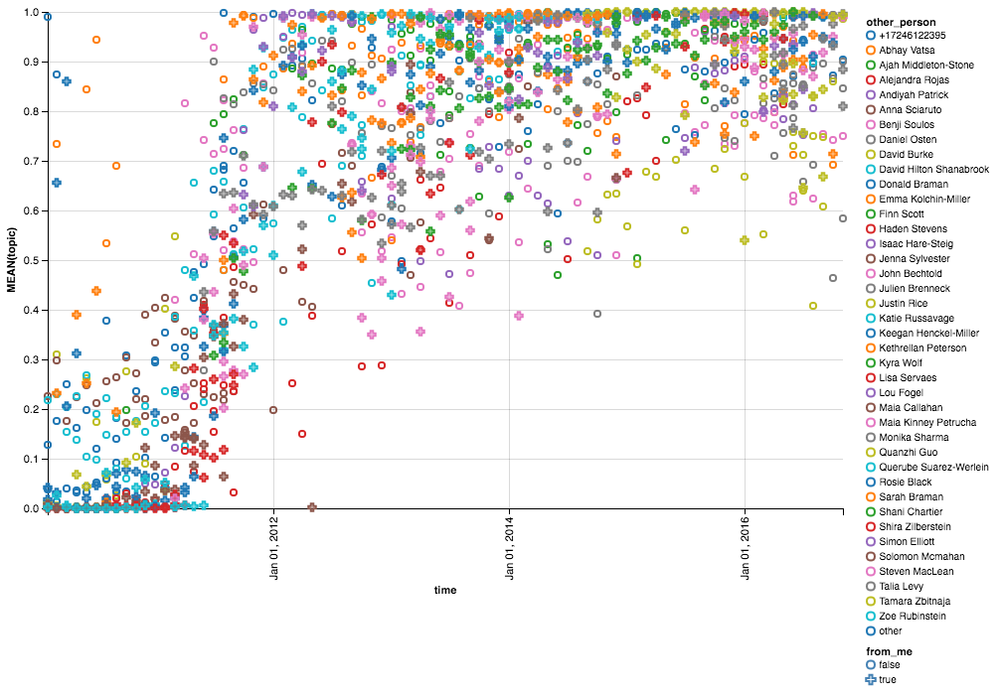

In [37]:
Chart(trained_df).mark_point().encode(
    y=Y('mean(topic):Q',
#         scale=Scale(
#             type='log',
#         ),
    ),
    x=X('time:T',
#         scale=Scale(
#             type='log',
#         ),
    ),
    shape='from_me:N',
    color='other_person:N',
#     size=Size('sum(chars)',
#         scale=Scale(
#             type='log',
#         ),
#     )
).transform_data(
    calculate=[
        Formula(field='chars',
               expr='length(datum.content)'),
    ]
).configure_cell(
    height=500.0,
    width=800.0,
)